# ReneWind

### Problem Statement

Renewable energy sources play an increasingly important role in the global energy mix, as the effort to reduce the environmental impact of energy production increases.

Out of all the renewable energy alternatives, wind energy is one of the most developed technologies worldwide. The U.S Department of Energy has put together a guide to achieving operational efficiency using predictive maintenance practices.

Predictive maintenance uses sensor information and analysis methods to measure and predict degradation and future component capability. The idea behind predictive maintenance is that failure patterns are predictable and if component failure can be predicted accurately and the component is replaced before it fails, the costs of operation and maintenance will be much lower.

The sensors fitted across different machines involved in the process of energy generation collect data related to various environmental factors (temperature, humidity, wind speed, etc.) and additional features related to various parts of the wind turbine (gearbox, tower, blades, break, etc.). 



### Objective
“ReneWind” is a company working on improving the machinery/processes involved in the production of wind energy using machine learning and has collected data of generator failure of wind turbines using sensors. They have shared a ciphered version of the data, as the data collected through sensors is confidential (the type of data collected varies with companies). Data has 40 predictors, 40000 observations in the training set and 10000 in the test set.

The objective is to build various classification models, tune them and find the best one that will help identify failures so that the generator could be repaired before failing/breaking and the overall maintenance cost of the generators can be brought down. 

“1” in the target variables should be considered as “failure” and “0” will represent “No failure”.

The nature of predictions made by the classification model will translate as follows:

- True positives (TP) are failures correctly predicted by the model.
- False negatives (FN) are real failures in a wind turbine where there is no detection by model. 
- False positives (FP) are detections in a wind turbine where there is no failure. 

So, the maintenance cost associated with the model would be:

**Maintenance cost** = `TP*(Repair cost) + FN*(Replacement cost) + FP*(Inspection cost)`
where,

- `Replacement cost = $40,000`
- `Repair cost = $15,000`
- `Inspection cost = $5,000`

Here the objective is to reduce the maintenance cost so, we want a metric that could reduce the maintenance cost.

- The minimum possible maintenance cost  =  `Actual failures*(Repair cost) = (TP + FN)*(Repair cost)`
- The maintenance cost associated with model = `TP*(Repair cost) + FN*(Replacement cost) + FP*(Inspection cost)`

So, we will try to maximize the ratio of minimum possible maintenance cost and the maintenance cost associated with the model.

The value of this ratio will lie between 0 and 1, the ratio will be 1 only when the maintenance cost associated with the model will be equal to the minimum possible maintenance cost.

### Data Dictionary

- The data provided is a transformed version of original data which was collected using sensors.
- Train.csv - To be used for training and tuning of models. 
- Test.csv - To be used only for testing the performance of the final best model.
- Both the datasets consist of 40 predictor variables and 1 target variable taghire jedi

### Outline

- <a href = #link1>  1. Data Overview </a>
- <a href = #link2>  2. Exploratory Data Analysis (EDA) </a>
- <a href = #link3>  3. Data Preprocessing </a>
- <a href = #link4>  4. Model Evaluation Criterion  </a>
- <a href = #link5>  5. Model Building with Original Data  </a>
- <a href = #link6>  6. Model Building with OverSampled Data </a>
- <a href = #link7>  7. Model Building with Undersampled data </a>
- <a href = #link8>  8. Model Selection for Tuning </a>
- <a href = #link9>  9. HyperparameterTuning </a>
- <a href = #link10>  10. Comparing all Models  </a>
- <a href = #link11>  11. The Final Model  </a>
- <a href = #link12>  12. Pipelines for Productionizing the Final Model </a>
- <a href = #link13>  13. Business Insights and Conclusions </a>

# <a name='link1'>  1. Data Overview</a>

### Importing necessary libraries and data

In [107]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pylab
import scipy.stats as stats

#Removes the limit from the number of displayed columns and rows.
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 200)

#Using plotly for specific plots of categorical variables
import plotly.graph_objects as go
import plotly.express as px
from  plotly.subplots import make_subplots
import plotly.io as pio

#Add a nice bachground to graphs and show graghs in the notebood
sns.set(color_codes=True)
%matplotlib inline 

#Function to randomly split the data into train data and test data
from sklearn.model_selection import train_test_split  

# To impute missing values
from sklearn.impute import KNNImputer

# To build a logistic regression model
from sklearn.linear_model import LogisticRegression

# To do cross validation
from sklearn.model_selection import StratifiedKFold, cross_val_score

# To oversample and undersample data
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

# to build decision tree classifier
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

# To get different metric scores
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score

# To build ensemble classifiers (Bagging)
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier

# To build ensemble classifiers (Boosting)
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, StackingClassifier
!pip install xgboost
from xgboost import XGBClassifier

# To be used for tuning the model
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# To be used for creating pipelines and personalizing them
from sklearn.pipeline import Pipeline

# Library to suppress warnings or deprecation notes
import warnings
warnings.filterwarnings("ignore")

In [3]:
#importing Train DataFrame with the name "Train.csv"
data=pd.read_csv('Train.csv')
data.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,Target
0,-4.464606,-4.679129,3.101546,0.506130,-0.221083,-2.032511,-2.910870,0.050714,-1.522351,3.761892,-5.714719,0.735893,0.981251,1.417884,-3.375815,-3.047303,0.306194,2.914097,2.269979,4.394876,-2.388299,0.646388,-1.190508,3.132986,0.665277,-2.510846,-0.036744,0.726218,-3.982187,-1.072638,1.667098,3.059700,-1.690440,2.846296,2.235198,6.667486,0.443809,-2.369169,2.950578,-3.480324,0
1,-2.909996,-2.568662,4.109032,1.316672,-1.620594,-3.827212,-1.616970,0.669006,0.387045,0.853814,-6.352826,4.271718,3.162020,0.257559,-3.547127,-4.284533,2.897271,1.508313,3.667963,7.123824,-4.095749,1.015082,-0.969790,-0.968207,2.063871,-1.646110,0.426956,0.734860,-4.470201,-2.771871,-2.504884,-3.782686,-6.823172,4.908562,0.481554,5.338051,2.381297,-3.127756,3.527309,-3.019581,0
2,4.283674,5.105381,6.092238,2.639922,-1.041357,1.308419,-1.876140,-9.582412,3.469504,0.763395,-2.573231,-3.349664,-0.594666,-5.246841,-4.309957,-16.232431,-0.999690,2.318208,5.941888,-3.857972,-11.599497,4.021252,-6.281194,4.633167,0.930157,6.280225,0.850654,0.268846,-2.206445,-1.328828,-2.398515,-3.097934,2.690334,-1.643048,7.566482,-3.197647,-3.495672,8.104779,0.562085,-4.227426,0
3,3.365912,3.653381,0.909671,-1.367528,0.332016,2.358938,0.732600,-4.332135,0.565695,-0.101080,1.914465,-0.951458,-1.255259,-2.706522,0.193223,-4.769379,-2.205319,0.907716,0.756894,-5.833678,-3.065122,1.596647,-1.757311,1.766444,-0.267098,3.625036,1.500346,-0.585712,0.783034,-0.201217,0.024883,-1.795474,3.032780,-2.467514,1.894599,-2.297780,-1.731048,5.908837,-0.386345,0.616242,0
4,-3.831843,-5.824444,0.634031,-2.418815,-1.773827,1.016824,-2.098941,-3.173204,-2.081860,5.392621,-0.770673,1.106718,1.144261,0.943301,-3.163804,-4.247825,-4.038909,3.688534,3.311196,1.059002,-2.143026,1.650120,-1.660592,1.679910,-0.450782,-4.550695,3.738779,1.134404,-2.033531,0.840839,-1.600395,-0.257101,0.803550,4.086219,2.292138,5.360850,0.351993,2.940021,3.839160,-4.309402,0


In [3]:
print(f'There are {data.shape[1]} columns and {data.shape[0]} rows in the data set.')  # f-string

There are 41 columns and 40000 rows in the data set.


Let us take a look at the imported data and the summary of different columns:

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 41 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   V1      39954 non-null  float64
 1   V2      39961 non-null  float64
 2   V3      40000 non-null  float64
 3   V4      40000 non-null  float64
 4   V5      40000 non-null  float64
 5   V6      40000 non-null  float64
 6   V7      40000 non-null  float64
 7   V8      40000 non-null  float64
 8   V9      40000 non-null  float64
 9   V10     40000 non-null  float64
 10  V11     40000 non-null  float64
 11  V12     40000 non-null  float64
 12  V13     40000 non-null  float64
 13  V14     40000 non-null  float64
 14  V15     40000 non-null  float64
 15  V16     40000 non-null  float64
 16  V17     40000 non-null  float64
 17  V18     40000 non-null  float64
 18  V19     40000 non-null  float64
 19  V20     40000 non-null  float64
 20  V21     40000 non-null  float64
 21  V22     40000 non-null  float64
 22

* Columns **V1- V40** are <font color='green'>quantitative variables</font> and <font color='green'>predictors </font> of our model.

* Column **Target** is our <font color='green'>target</font> variable.

Now we check the missing values in the data. Below, number of missing values in any column of the imported data are shown:

In [5]:
data.isnull().sum()

V1        46
V2        39
V3         0
V4         0
V5         0
V6         0
V7         0
V8         0
V9         0
V10        0
V11        0
V12        0
V13        0
V14        0
V15        0
V16        0
V17        0
V18        0
V19        0
V20        0
V21        0
V22        0
V23        0
V24        0
V25        0
V26        0
V27        0
V28        0
V29        0
V30        0
V31        0
V32        0
V33        0
V34        0
V35        0
V36        0
V37        0
V38        0
V39        0
V40        0
Target     0
dtype: int64

There are 46 and 39 missing values in columns **V1** and **V2**, respectively. We'll explore this further.

# <a name='link2'>  2. Exploratory Data Analysis (EDA)</a>

- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.

First, we define a few functions for EDA and next we proceed with our analysis.

### Summary of Quantitative Variables

Let us view the statistical summary of the numerical columns in the data.

In [8]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
V1,39954.0,-0.288120,3.449072,-13.501880,-2.751460,-0.773518,1.836708,17.436981
V2,39961.0,0.442672,3.139431,-13.212051,-1.638355,0.463939,2.537508,13.089269
V3,40000.0,2.505514,3.406263,-11.469369,0.202682,2.265319,4.584920,18.366477
V4,40000.0,-0.066078,3.437330,-16.015417,-2.349574,-0.123691,2.148596,13.279712
V5,40000.0,-0.044574,2.107183,-8.612973,-1.507206,-0.096824,1.346224,9.403469
V6,40000.0,-1.000849,2.036756,-10.227147,-2.363446,-1.006635,0.373909,7.065470
V7,40000.0,-0.892793,1.756510,-8.205806,-2.036913,-0.934738,0.206820,8.006091
V8,40000.0,-0.563123,3.298916,-15.657561,-2.660415,-0.384188,1.714383,11.679495
V9,40000.0,-0.007739,2.161833,-8.596313,-1.493676,-0.052085,1.425713,8.507138
V10,40000.0,-0.001848,2.183034,-11.000790,-1.390549,0.105779,1.486105,8.108472


* The target variable has binary values (zero and one)
* Predicting variables V1-V40 have continues values.
* Minimum value of each predictor is a negative number in range (-23,-7)
* Maximum value of each predictor is a positive number in range (6,25)
* Most values are between (-6,5).
* Average of each predictor is between (-3.5, 2.5)

### Boxplot of All Quantitative Columns
We have 40 variables which we do not have a proper information on them. Plotting each variable may not give us any insights on the variables. Hence, in the following we present boxplots of all variables. 

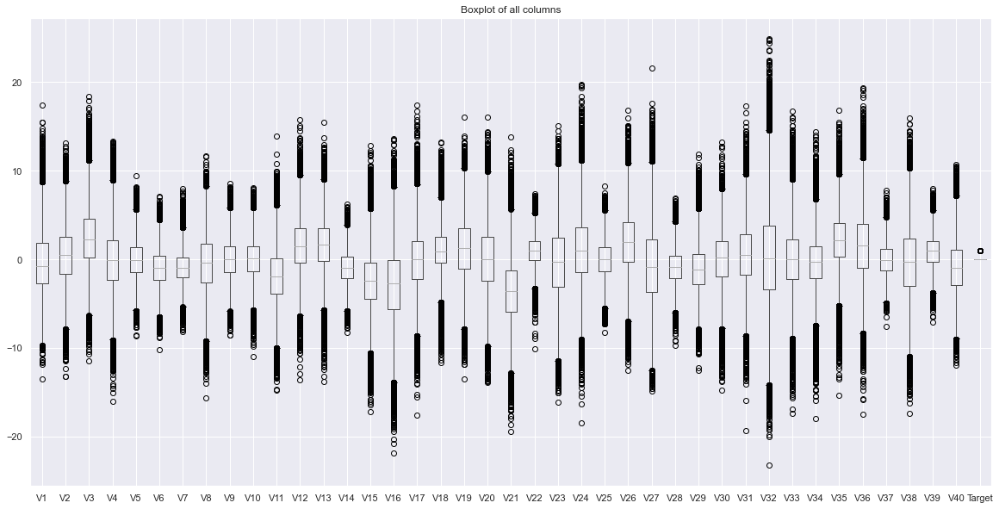

In [9]:
plt.figure(figsize=(20,10))

data.boxplot();
plt.title('Boxplot of all columns');

* Range of variables does not seem to be very different.
* Among all feature values, minimum value is close -24 to and max value is about 25.
* Most values are between 10 and -10.
* There seems to be outliers in each columns of the data set.

### Individual Histogram of  Features

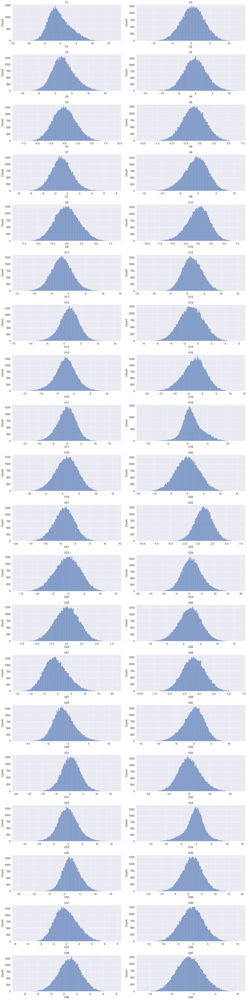

In [163]:
plt.figure(figsize=(20, 80))

# numerical columns
columns=data.drop(['Target'], axis=1).dtypes[data.drop(['Target'], axis=1).dtypes != 'object'].index 

# plot
for i, variable in enumerate(columns):
    plt.subplot(20, 2, i + 1)
    sns.set(font_scale = 1.4)
    sns.histplot(data= data, x=variable)
    plt.tight_layout()
    plt.title(variable)

* We can see that distribution of most features are approximately normal.
* Distribution of very few features is skewed.
* The average and median values for most features are close to zero.

### Correlations

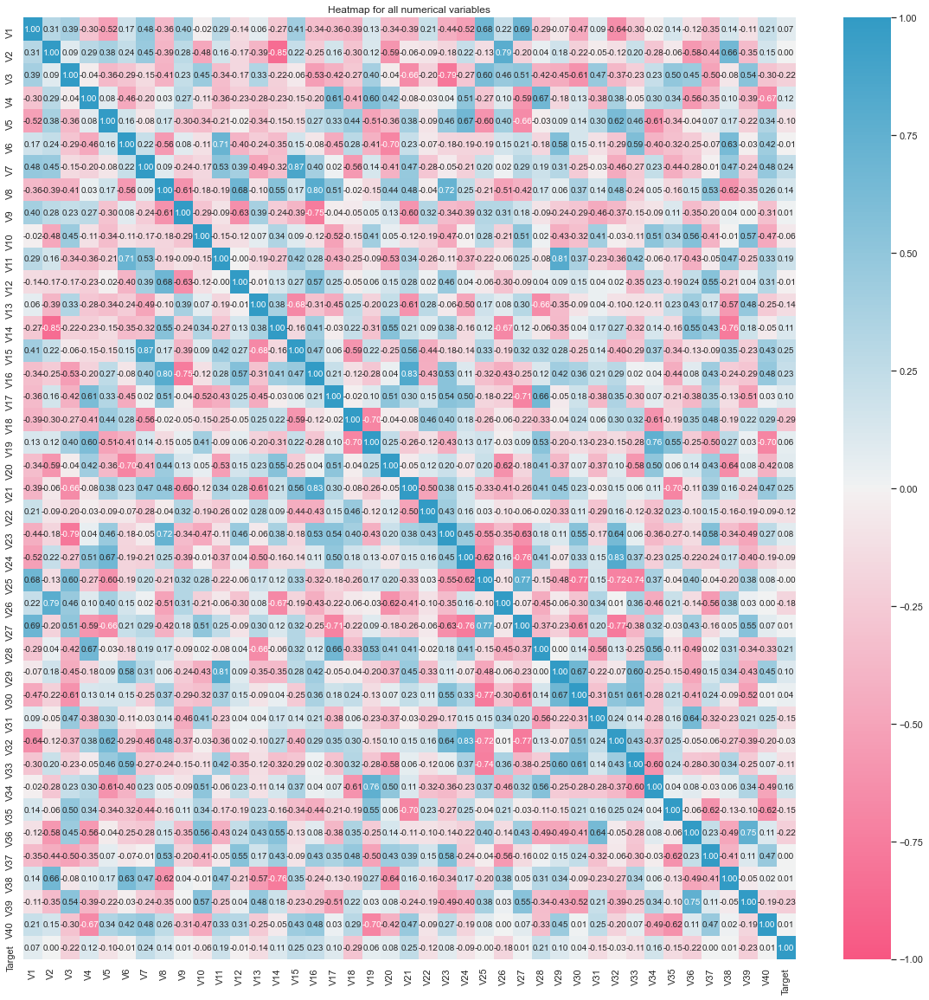

In [10]:
plt.figure(figsize=(20,20))

# color map
cmap = sns.diverging_palette(0, 230, 90, 60, as_cmap=True)

sns.heatmap(data.corr(),annot=True,vmin=-1,vmax=1,fmt='.2f',cmap=cmap)
plt.title('Heatmap for all numerical variables')
plt.show()

**Highly correlated variables** are listed as following:

In [11]:
data_corr=data.corr()
corr_level=0.6

for colname in data.columns:
   
    print ("\nVaribale *{}* has high positive correlation with the following variables:".format(colname))
    print (data_corr[data_corr[colname]>corr_level][colname].to_string())
    if data_corr[data_corr[colname]<-corr_level][colname].shape[0]==0:
        print ("\nand does not have any high negative correlations.")
    else:
        print ("\nand high negative correlation with:")
        print (data_corr[data_corr[colname]<-corr_level][colname].to_string())
    print('----------------------------------------------------------------------------')


Varibale *V1* has high positive correlation with the following variables:
V1     1.000000
V25    0.677999
V27    0.688550

and high negative correlation with:
V32   -0.637005
----------------------------------------------------------------------------

Varibale *V2* has high positive correlation with the following variables:
V2     1.000000
V26    0.785097
V38    0.659136

and high negative correlation with:
V14   -0.853848
----------------------------------------------------------------------------

Varibale *V3* has high positive correlation with the following variables:
V3     1.000000
V25    0.602591

and high negative correlation with:
V21   -0.657938
V23   -0.787187
V30   -0.612740
----------------------------------------------------------------------------

Varibale *V4* has high positive correlation with the following variables:
V4     1.000000
V17    0.612099
V28    0.666983

and high negative correlation with:
V40   -0.669144
-------------------------------------------------

* Target variable does not have a strong positive or negative correlation with any of the predicting variables.
* V22 seems to be independent from the rest of the variables.
* V27 is highly correlated with other variables (with 12 variables) in the data set.
* V2 is highly negatively correlated with V14. As V2 increases, values of V14 decreases and vice versa.
* V7 is highly positively correlated with V15. As V7 increases, values of V15 decreases and vice versa.
* V8 is highly positively correlated with V16.
* V11 is highly positively correlated with V29.
* V16 is highly positively correlated with V8 and V21.
* V24 is highly positively correlated with V32.

Correlation between features does not generally affect the predictive performance of learning models. However, for case of our study, correlation is a problem because we aim to do inference on our models. As a result, later we delete highly correlated features from the data.

### Features vs. Target

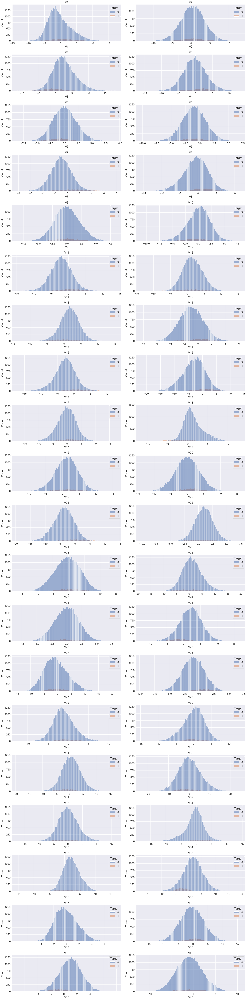

In [164]:
plt.figure(figsize=(20, 80))

# numerical columns
columns=data.drop(['Target'], axis=1).dtypes[data.drop(['Target'], axis=1).dtypes != 'object'].index 

# plot
for i, variable in enumerate(columns):
    plt.subplot(20, 2, i + 1)
    sns.set(font_scale = 1.4)
    sns.histplot(data= data, x=variable, hue='Target')
    plt.tight_layout()
    plt.title(variable)

* Percentage of generator failure is far more less than non-failure. 
* For most features,  target variable equals to zero when the feature value is extreme . 
* When the feature value is extremely large or extremely small it indicates that there is no generator failure
* If V1, V2, V4, V14, V20, V24, V27, V38, or V40 value is greater than 5 or smaller than -5 be no generator failure.
* If V3, V5, V13,  V18, V22, V26, V27, V31, V36, or V39 value is greater than 5 there will be no generator failure. However, if the feature value is smaller than -5, there is a possibility that the generator would fail.
* If V7, V8, V11, V15, V16, V17, V20,  V21, V28, V29, V3, or V34 value is less than -5 there will be no generator failure. However, if the feature value is greater than -5, there is a possibility that the generator would fail.

### Features vs. Features
We select a set of high correlated features to study their relation agaings each others.

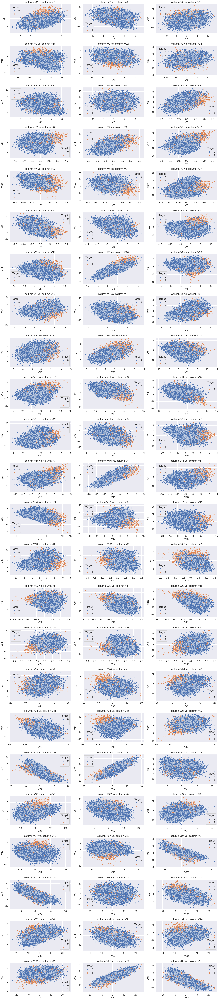

In [211]:
plt.figure(figsize=(20, 90))

# selecting clumns to study
column_list_to_study= ['V2', 'V7', 'V8', 'V11', 'V16', 'V22', 'V24', 'V27', 'V32']
i=0

# plot
for variable_1 in column_list_to_study:
    for variable_2 in column_list_to_study:
        if variable_1==variable_2:
            continue 
        plt.subplot(24, 3, i + 1)
        i=i+1
        sns.set(font_scale = 1.4)
        sns.scatterplot(data=data, x=variable_1, y=variable_2, hue='Target');
        plt.tight_layout()
        plt.title( 'column {} vs. column {}'.format(variable_1, variable_2))

#### Observations
* There are positive as well as negative correlations between the selected features.
* With increase in V2 values, V7 values increase.
* When V2 is between (-5,5) and V7 values are high, the possibility of failure increases.
* When V2 is between (-5,5) and V16 values are high, the possibility of failure increases.
* When V2 is between (-5,5) and V22 values are low, the possibility of failure increases.
* When V7 is greater than zero and V8 values are greater than -1, the possibility of failure increases.
* With increase in V7 values, V11 and V16 values increase.
* With increase in V7 values, V22, V24, and V32 values decreases.
* When V7 is greater than zero the possibility of failure increases.
* When V7 is greater than zero and V16 values are greater than -1, the possibility of failure increases.
* When V7 is greater than zero and V24 values are less than zero, the possibility of failure increases.
* When V7 is greater than zero and V27 values are between (0, 10), the possibility of failure increases.
* When V7 is greater than zero and V32 values are less than -1, the possibility of failure increases.
* When V8 is greater than -1 and V11 values are greater than -3, the possibility of failure increases.
* V8 and V16 are positively and highly correlated.
* When V8 is greater than -1 and V16 values are greater than 0, the possibility of failure increases.
* When V8 is greater than -5 and V22 values are less than -3, the possibility of failure increases.
* When V8 is greater than -5 and V22 values are less than -3, the possibility of failure increases.

# <a name='link3'>  3. Data Pre-processing (EDA)</a>


### 3.1 Data Preparation for Modeling

For creating training and validation sets we do the followings:

In [175]:
# Make a copy of the data
data1 = data.copy()

# Count the number of duplicates in rows
data1.duplicated().sum()
print('Among the {} rows of the dataframe {} rows are unique and {} rows are duplicates.'.format(data.shape[0] , (~data.duplicated()).sum(), data.duplicated().sum()))

Among the 40000 rows of the dataframe 40000 rows are unique and 0 rows are duplicates.


##### Splitting data into training and validation sets

In [5]:
##### Defining predictors(x) and target (y) variables in data1
X=data1.drop(['Target'], axis=1)
y=data1[['Target']]

# We already have a test set which we will later upload
# We only need to split data1 into train and validation sets in 75:25 ratio
    
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.25, random_state=1, stratify=y
)

##### Reading test data

In [6]:
#importing Test DataFrame with the name "Test.csv"
data_test=pd.read_csv('Test.csv')

# Seperating X and Y variables
X_test=data_test.drop(['Target'], axis=1)
y_test=data_test[['Target']]

In [20]:
print("Number of rows in train data =", X_train.shape[0]);
print("Number of rows in validation data =", X_val.shape[0]);
print("Number of rows in test data =", X_test.shape[0]);

Number of rows in train data = 30000
Number of rows in validation data = 10000
Number of rows in test data = 10000


In [30]:
target='Target'

print("\nNumber (percentage) of {} is as follow:".format(target))

print("\nWhole DataFrame:")
print("failure:      {0} ({1:2.2f}%)".format(data1[target].value_counts()[1], data1[target].value_counts(normalize=True)[1] * 100 ))
print("no failure:   {0} ({1:2.2f}%)".format(data1[target].value_counts()[0], data1[target].value_counts(normalize=True)[0] * 100 ))


print("\nTraining Set:")
print("failure:      {0} ({1:2.2f}%)".format(y_train[target].value_counts()[1], y_train[target].value_counts(normalize=True)[1] * 100 ))
print("no failure:   {0} ({1:2.2f}%)".format(y_train[target].value_counts()[0], y_train[target].value_counts(normalize=True)[0] * 100 ))

print("\nValidation Set:")
print("failure:      {0} ({1:2.2f}%)".format(y_val[target].value_counts()[1], y_val[target].value_counts(normalize=True)[1] * 100 ))
print("no failure:   {0} ({1:2.2f}%)".format(y_val[target].value_counts()[0], y_val[target].value_counts(normalize=True)[0] * 100 ))


print("\nTest Set:")
print("failure:      {0} ({1:2.2f}%)".format(y_test[target].value_counts()[1], y_test[target].value_counts(normalize=True)[1] * 100 ))
print("no failure:   {0} ({1:2.2f}%)".format(y_test[target].value_counts()[0], y_test[target].value_counts(normalize=True)[0] * 100 ))


Number (percentage) of Target is as follow:

Whole DataFrame:
failure:      2187 (5.47%)
no failure:   37813 (94.53%)

Training Set:
failure:      1640 (5.47%)
no failure:   28360 (94.53%)

Validation Set:
failure:      547 (5.47%)
no failure:   9453 (94.53%)

Test Set:
failure:      547 (5.47%)
no failure:   9453 (94.53%)


The percentage of certified and denied Visas in the whole data set, the training set, and the test set are almost similar. Hence, splitted data sets have a good distribution for generator failure status.

The sets are **imbalanced** due to the fact that the percentage of generator failure is near 5.47% among all cases.

### 3.3 Missing-Value Treatment

We have missing values in the V1 and V2 columns.

In [7]:
print('Number of missing valuse in train set:')
print(X_train.isnull().sum()[X_train.isnull().sum()>0].to_string())

print('\nNumber of missing valuse in validation set:')
print(X_val.isnull().sum()[X_val.isnull().sum()>0].to_string())

print('\nNumber of missing valuse in test set:')
print(X_test.isnull().sum()[X_test.isnull().sum()>0].to_string())

Number of missing valuse in train set:
V1    41
V2    20

Number of missing valuse in validation set:
V1     5
V2    19

Number of missing valuse in test set:
V1    11
V2     7


In [8]:
# list with names of columns that will be used for imputation
col_for_imputation = X_train.isnull().sum()[X_train.isnull().sum()>0].index.tolist()

* We will use KNN imputer to impute missing values.
* `KNNImputer`: Each sample's missing values are imputed by looking at the n_neighbors nearest neighbors found in the training set. Default value for n_neighbors=5.
* KNN imputer replaces missing values using the average of k nearest non-missing feature values.
* Nearest points are found based on euclidean distance.

**The values obtained might not be integer always. But, since all of our features have continuous values do not need to round the obtained values.**


In [9]:
# First, We build the imputer based on train data
imputer = KNNImputer(n_neighbors=5);
impute = imputer.fit(X_train[col_for_imputation])

In [10]:
# Next, we use the built imputer to transform all three train, validation, and test sets
X_train[col_for_imputation] = impute.transform(X_train[col_for_imputation])
X_val[col_for_imputation] = imputer.transform(X_val[col_for_imputation])
X_test[col_for_imputation] = imputer.transform(X_test[col_for_imputation])

In [11]:
print('Number of missing valuse in train set = {}.'.format(X_train.isnull().sum().sum()))
print('Number of missing valuse in validation set = {}.'.format(X_val.isnull().sum().sum()))
print('Number of missing valuse in test set = {}.'.format(X_test.isnull().sum().sum()))

Number of missing valuse in train set = 0.
Number of missing valuse in validation set = 0.
Number of missing valuse in test set = 0.


### 3.4 Outlier Detection and Treatment

We use **IQR**, which is the interval going from the 1st quartile to the 3rd quartile of the data in question, and then flag points for investigation if they are outside 1.5 * IQR. 

##### Outlier Detection:
Let us look at the boxplot of our quantitative variables.

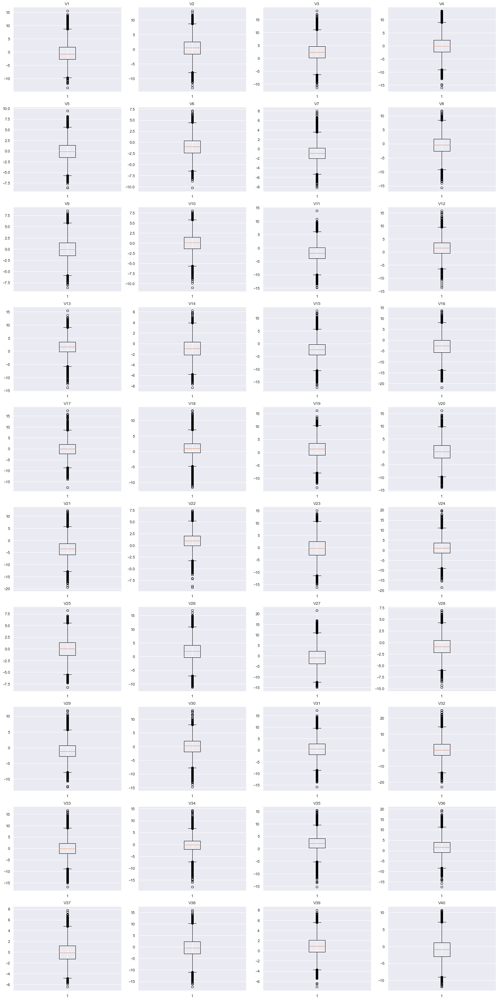

In [27]:
plt.figure(figsize=(20, 40))

# numerical columns
columns=X_train.dtypes[X_train.dtypes != 'object'].index 

# plot
for i, variable in enumerate(columns):
    plt.subplot(10, 4, i + 1)
    plt.boxplot(X_train[variable], whis=1.5)
    plt.tight_layout()
    plt.title(variable)

All quantitative variables have outliers.

##### Outlier Treatment on training, validation, and test sets:
We treat outliers in each set by flooring and capping based on training set statistics. In the following, we make a function to calculate lower and upper whiskers of the training data attributes and use them for feature clipping in training,validation, or test sets. We do this because in order to avoid data leakage, any data transformation on the sets should be based on training set statistics.

In [12]:
#Create function to treat outliers based on training IQR
def treat_outliers_func(x):
    """
    treats outliers in dataframe x
    """
    # using X_train as a global dataframe
    global X_train
    
    # calculating lower whisker and upper whiskers based on training data
    Q1 = X_train[x.name].quantile(0.25)  # 25th quantile
    Q3 = X_train[x.name].quantile(0.75)  # 75th quantile
    IQR = Q3 - Q1
    Train_Lower_Whisker = Q1 - 1.5 * IQR
    Train_Upper_Whisker = Q3 + 1.5 * IQR

    # clipping x dataframe with lower and upper whiskers of the training data 
    # assigning the value of Train_Lower_Whisker to the values in X data columns that are smaller than Train_Lower_Whisker
    # assigning the value of Train_Upper_Whisker to the values in X data columns that are greater than Train_Lower_Whisker

    x = np.clip(x, Train_Lower_Whisker, Train_Upper_Whisker)

    return x

Now, we apply the frac_outside_IQR function on training, validation, and test data.

In [13]:
#Treating outliers in train set
X_train=X_train.apply(treat_outliers_func, axis=0)

#Treating outliers in validation set
X_val=X_val.apply(treat_outliers_func, axis=0)

#Treating outliers in test set
X_test=X_test.apply(treat_outliers_func, axis=0)

Boxplot below shows that there are no more outliers in the quantitative features of the training set.


boxplot of training data features


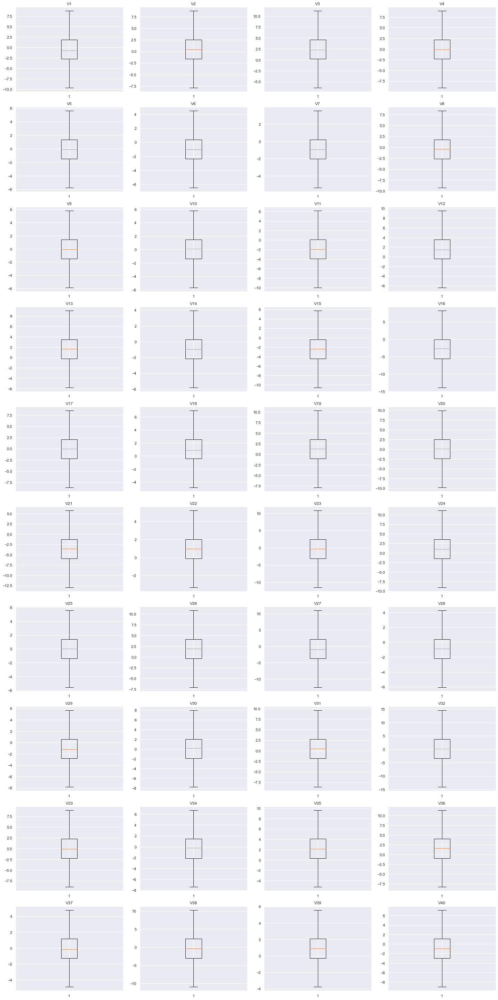

In [30]:
plt.figure(figsize=(20, 40))

df=X_train

# numerical columns
columns=df.dtypes[df.dtypes != 'object'].index

print('\nboxplot of training data features')

# plot
for i, variable in enumerate(columns):
    plt.subplot(10, 4, i + 1)
    plt.boxplot(df[variable], whis=1.5)
    plt.tight_layout()
    plt.title(variable)


boxplot of validation data features


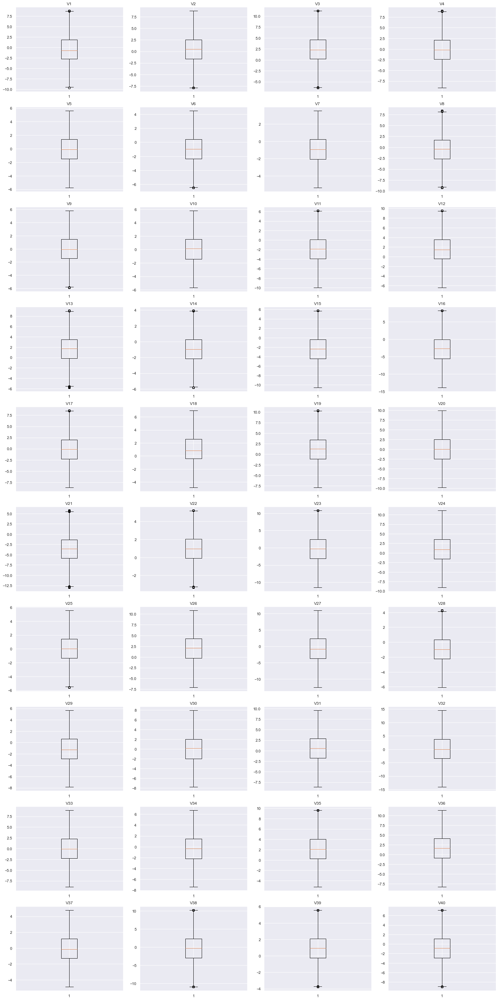

In [31]:
plt.figure(figsize=(20, 40))

df=X_val

# numerical columns
columns=df.dtypes[df.dtypes != 'object'].index

print('\nboxplot of validation data features')

# plot
for i, variable in enumerate(columns):
    plt.subplot(10, 4, i + 1)
    plt.boxplot(df[variable], whis=1.5)
    plt.tight_layout()
    plt.title(variable)

### 3.4 Removing Highly Correlated Features

Collinearity occurs when predictor variables in a model are highly correlated.Removing collinear features can help a model to generalize and improves the interpretability of the model. In the following, we create a function to remove highly correlated features.

In [14]:
def remove_collinear_features(x, threshold):
    '''
    Objective:
        Remove collinear features in a dataframe x with a correlation coefficient
        greater than the threshold. 
    '''

    # Calculate the correlation matrix
    corr_matrix = x.corr()
    iters = range(len(corr_matrix.columns) - 1)
    drop_cols = []

    # Iterate through the correlation matrix and compare correlations
    for i in iters:
        for j in range(i+1):
            item = corr_matrix.iloc[j:(j+1), (i+1):(i+2)]
            col = item.columns
            row = item.index
            val = abs(item.values)

            # If correlation exceeds the threshold
            if val >= threshold:
                # Print the correlated features and the correlation value
                #print(col.values[0], "|", row.values[0], "|", round(val[0][0], 2))
                drop_cols.append(col.values[0])

    # Drop one of each pair of correlated columns
    global drops
    drops = set(drop_cols)
    x.drop(columns=drops, axis=1, inplace=True)
    print('Removed Columns are {}'.format(drops))
    return x

In [15]:
#Removing correlated features from training data
X_train= remove_collinear_features(X_train, 0.7) #Passing DataFrame and Threshold value

#Removing correlated features from validation data
X_val.drop(columns=drops, axis=1, inplace=True)

#Removing correlated features from test data
X_test.drop(columns=drops, axis=1, inplace=True)

Removed Columns are {'V34', 'V39', 'V40', 'V27', 'V26', 'V32', 'V16', 'V29', 'V15', 'V11', 'V23', 'V30', 'V33', 'V21', 'V14', 'V38'}


# <a name='link4'>  4. Model Evaluation Criterion </a>

#### Three types of cost are associated with the provided problem
1. Replacement cost - False Negatives - Predicting no failure, while there will be a failure
2. Inspection cost - False Positives - Predicting failure, while there is no failure 
3. Repair cost - True Positives - Predicting failure correctly

#### How to reduce the overall cost?
* We need to create a customized metric, that can help to bring down the overall cost.
* The cost associated with any model = TP * 15000 + FP * 5000 + FN * 40000
* And the minimum possible cost will be when, the model will be able to identify all failures, in that case, the cost will be (TP + FN) * 15000
* So, we will try to maximize `Minimum cost/Cost associated with model`

**Let's create two functions to calculate different metrics and confusion matrix, so that we don't have to use the same code repeatedly for each model.**

In [16]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    TP = confusion_matrix(target, model.predict(predictors))[1, 1]
    FP = confusion_matrix(target, model.predict(predictors))[0, 1]
    FN = confusion_matrix(target, model.predict(predictors))[1, 0]
    Cost = TP * 15 + FP * 5 + FN * 40  # maintenance cost by using model
    Min_Cost = (TP + FN) * 15  # minimum possible maintenance cost = number of actual positives
    Percent = Min_Cost / Cost  # ratio of minimum possible maintenance cost and maintenance cost by model

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "Accuracy": acc,
            "Recall": recall,
            "Precision": precision,
            "F1": f1,
            "Minimum_Vs_Model_cost": Percent,
        },
        index=[0],
    )

    return df_perf

In [190]:
def confusion_matrix_sklearn(model, predictors, target):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    y_pred = model.predict(predictors)
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)
    

    sns.set(font_scale = 1.1)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="", cmap="Greens_r")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

#### **Defining scorer to be used for hyperparameter tuning**

- Every prediction of a classification model will be either a TP, FP, FN or TN.
- For this problem, we not only want to minimize false negatives but also false positives and we are also given the costs associated with each type of prediction.
- Hence, overall we want to reduce the maintenance cost which is: `TP*(Repair cost) + FN*(Replacement cost) + FP*(Inspection cost)`
- In simple language, we can say that we are assigning different weightage to the different types of predictions.
- There is no inbuilt metric which can help us minimize the maintenance cost i.e., help us reduce FP and FN as per the weightage - We don't have any such inbuilt metric.
- In sklearn, we can define **custom scorers** also as per our need.
- For this classification problem, we need to reduce the maintenance cost, which can be reiterated as:
  - Minimize (maintenance cost)
  - Maximize (1/maintenance cost)
  - Maximize (minimum possible maintenance cost/maintenance cost)
- Eventually, all 3 metrics will do the same work in the backend and the only difference will be in the scale of the values of the metric.

- The metric provided in the next cell is to `maximize(minimum possible maintenance cost/maintenance cost)`
- You can modify the metric as per convenience and use it further to tune the models.

In [18]:
# defining metric to be used for optimization and cross-validation
def Minimum_Vs_Model_cost(y_train, y_pred):
    """
    We want the model to optimize the maintenance cost and reduce it to the lowest possible value.
    The lowest possible maintenance cost will be achieved when each sample is predicted correctly.

    In such a scenario, the maintenance cost will be the total number of failures times the maintenance cost of repairing one generator,
    which is given by (TP + FN) * 40 (i.e., the actual positives*40).
    For any other scenario,
    the maintenance cost associated with the model will be given by (TP * 15 + FP * 5 + FN * 40).

    We will use the ratio of these two maintenance costs as the cost function for our model.
    The greater the ratio, the lower the associated maintenance cost and the better the model.
    """
    TP = confusion_matrix(y_train, y_pred)[1, 1]
    FP = confusion_matrix(y_train, y_pred)[0, 1]
    FN = confusion_matrix(y_train, y_pred)[1, 0]
    return ((TP + FN) * 15) / (TP * 15 + FP * 5 + FN * 40)


# A value of .80 here, will represent that the minimum maintenance cost is 80% of the maintenance cost associated with the model.
# Since minimum maintenance cost is constant for any data, when minimum cost will become 100% of maintenance cost associated with the model
# Model will have give the least possible maintenance cost.

In [19]:
# Type of scoring used to compare parameter combinations
# Higher the values, the lower the maintenance cost
scoring = metrics.make_scorer(Minimum_Vs_Model_cost, greater_is_better=True)

# <a name='link5'>  5. Model Building with Original Data </a>

### 5.1- Classifying Models

In [20]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("LR", LogisticRegression(random_state=1)))
models.append(("dtree", DecisionTreeClassifier(random_state=1)))
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random Forest", RandomForestClassifier(random_state=1)))
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("Xgboost", XGBClassifier(random_state=1, eval_metric="logloss")))

results = []  # Empty list to store all model's CV scores
names = []  # Empty list to store name of the models

### 5.2 Model Performance Evaluation

#### Cross Validation on Training Data

- `K-Folds cross-validation` provides dataset indices to split data into train/validation sets. Split dataset into k consecutive stratified folds (without shuffling by default). Each fold is then used once as validation while the k - 1 remaining folds form the training set.

- `Stratified K-fold` is a variation of KFold that returns stratified folds. The folds are made by preserving the percentage of samples for each class.

In [40]:
# loop through all models to get the mean cross validated score
for name, model in models:
    scoring = scoring
    kfold = StratifiedKFold(
        n_splits=5, shuffle=True, random_state=1
    )  # Setting number of splits equal to 5
    cv_result = cross_val_score(
        estimator=model, X=X_train, y=y_train, scoring=scoring, cv=kfold
    )
    results.append(cv_result)
    names.append(name)

In [41]:
print('\nSummary Statistics of CV Scores on Training Set:')
df_CV_score = pd.DataFrame()
df_CV_score[" "] = names
df_CV_score["Min"] = np.array(results).min(axis=1)
df_CV_score["Average"] = np.array(results).mean(axis=1)
df_CV_score["Max"] = np.array(results).max(axis=1)
df_CV_score["STD"] = np.array(results).std(axis=1)
df_CV_score.set_index(' ',inplace=True)
df_CV_score.T


Summary Statistics of CV Scores on Training Set:


,LR,dtree,Bagging,Random Forest,GBM,Adaboost,Xgboost
Min,0.512500,0.628754,0.644823,0.663073,0.639792,0.569774,0.733781
Average,0.544494,0.641421,0.663730,0.690188,0.656484,0.585154,0.751421
Max,0.575439,0.672131,0.680969,0.714078,0.675824,0.601835,0.768750
STD,0.020672,0.015830,0.011787,0.020744,0.014287,0.011001,0.014377


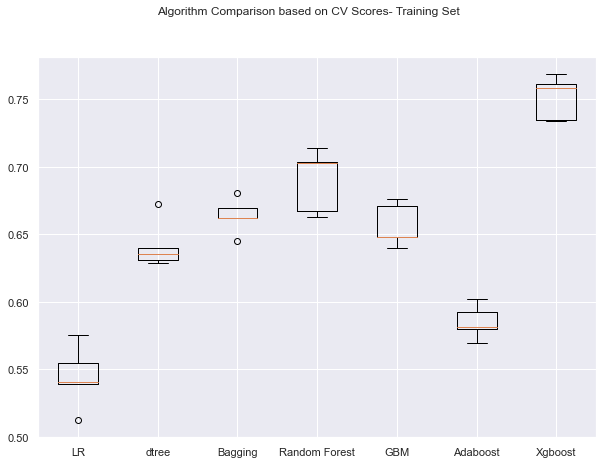

In [42]:
# Boxplots for CV scores of all models on Training Set
fig = plt.figure(figsize=(10, 7))

fig.suptitle("Algorithm Comparison based on CV Scores- Training Set")
ax = fig.add_subplot(111)

plt.boxplot(results)
ax.set_xticklabels(names)

plt.show()

#### Model Performance on Training Data

In [22]:
# creating empty data frame With NaN values
df_metrics_train = pd.DataFrame(columns = ['Accuracy', 'Recall', 'Precision', 'F1', 'Minimum_Vs_Model_cost'])
    
# adding rows to the empty data frame
for name, model in models:
    df_metrics_train.loc[name] = model_performance_classification_sklearn(model.fit(X_train, y_train), X_train, y_train).loc[0]

df_metrics_train

,Accuracy,Recall,Precision,F1,Minimum_Vs_Model_cost
LR,0.969733,0.518902,0.877320,0.652107,0.547640
dtree,1.000000,1.000000,1.000000,1.000000,1.000000
Bagging,0.996733,0.941463,0.998706,0.969240,0.910774
Random Forest,0.999967,0.999390,1.000000,0.999695,0.998985
GBM,0.985600,0.762805,0.966770,0.852761,0.712218
Adaboost,0.975033,0.609146,0.902439,0.727339,0.597595
Xgboost,0.999933,0.998780,1.000000,0.999390,0.997972


#### Model Performance on Validation Data

In [23]:
# creating empty data frame With NaN values
df_metrics_val = pd.DataFrame(columns = ['Accuracy', 'Recall', 'Precision', 'F1', 'Minimum_Vs_Model_cost'])
    
# adding rows to the empty data frame
for name, model in models:
    df_metrics_val.loc[name] = model_performance_classification_sklearn(model.fit(X_train, y_train), X_val, y_val).loc[0]

df_metrics_val

,Accuracy,Recall,Precision,F1,Minimum_Vs_Model_cost
LR,0.9685,0.491773,0.879085,0.630715,0.534876
dtree,0.9671,0.703839,0.697464,0.700637,0.626814
Bagging,0.9825,0.707495,0.962687,0.815595,0.668160
Random Forest,0.9857,0.747715,0.987923,0.851197,0.702483
GBM,0.9814,0.702011,0.943489,0.805031,0.661960
Adaboost,0.9710,0.575868,0.844504,0.684783,0.573977
Xgboost,0.9888,0.809872,0.982262,0.887776,0.756570


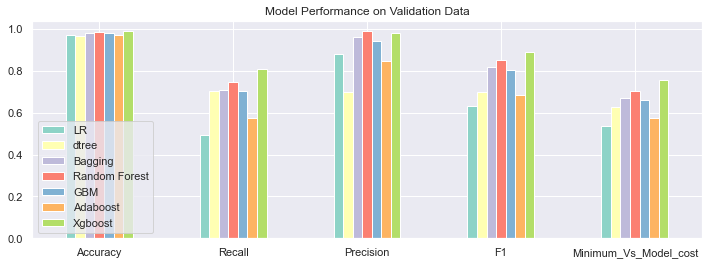

In [44]:
#setting color
color=sns. set_palette("Set3");

#plotting
df_metrics_val.T.plot(kind="bar", figsize=(12, 4));
plt.legend(df_metrics_val.T.columns.tolist(), loc='lower left');
plt.xticks(rotation=0);
plt.title('Model Performance on Validation Data');

# <a name='link6'>  6. Model Building with OverSampled Data </a>

### 6.1- OverSampled Data

In [32]:
# Synthetic Minority Over Sampling Technique
sm = SMOTE(sampling_strategy=1, k_neighbors=5, random_state=1)
X_train_over, y_train_over = sm.fit_resample(X_train, y_train)

print("\nNumber (percentage) of {} in the oversampled training set:".format(target))
print("failure:      {0} ({1:2.2f}%)".format(y_train_over[target].value_counts()[1], y_train_over[target].value_counts(normalize=True)[1] * 100 ))
print("no failure:   {0} ({1:2.2f}%)".format(y_train_over[target].value_counts()[0], y_train_over[target].value_counts(normalize=True)[0] * 100 ))



Number (percentage) of Target in the oversampled training set:
failure:      28360 (50.00%)
no failure:   28360 (50.00%)


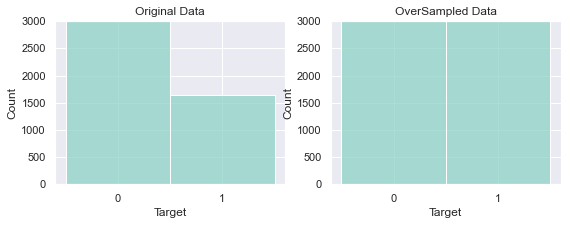

In [46]:
#plotting 
plt.figure(figsize=(14, 3))

plt.subplot(1, 3, 1)
ax=sns.histplot(y_train['Target'].apply(str));
plt.ylim([0, 3000]);
plt.title('Original Data');

plt.subplot(1, 3, 2)
ax=sns.histplot(y_train_over['Target'].apply(str));
plt.ylim([0, 3000]);
plt.title('OverSampled Data');

### 6.2- Classifying Models

In [33]:
models_over = []  # Empty list to store all the models

# Appending models into the list
models_over.append(("LR_over", LogisticRegression(random_state=1)))
models_over.append(("dtree_over", DecisionTreeClassifier(random_state=1)))
models_over.append(("Bagging_over", BaggingClassifier(random_state=1)))
models_over.append(("Random Forest_over", RandomForestClassifier(random_state=1)))
models_over.append(("GBM_over", GradientBoostingClassifier(random_state=1)))
models_over.append(("Adaboost_over", AdaBoostClassifier(random_state=1)))
models_over.append(("Xgboost_over", XGBClassifier(random_state=1, eval_metric="logloss")))

results_over = []  # Empty list to store all model's CV scores
names_over = []  # Empty list to store name of the models

### 6.3 Model Performance Evaluation

#### Cross Validation on OverSampled Training Data

In [48]:
# loop through all models to get the mean cross validated score
for name, model in models_over:
    scoring = scoring
    kfold = StratifiedKFold(
        n_splits=5, shuffle=True, random_state=1
    )  # Setting number of splits equal to 5
    cv_result = cross_val_score(
        estimator=model, X=X_train_over, y=y_train_over, scoring=scoring, cv=kfold
    )
    results_over.append(cv_result)
    names_over.append(name)

In [49]:
print('\nSummary Statistics of CV Scores on OverSampled Training Set:')
df_CV_score_over = pd.DataFrame()
df_CV_score_over[" "] = names_over
df_CV_score_over["Min"] = np.array(results_over).min(axis=1)
df_CV_score_over["Average"] = np.array(results_over).mean(axis=1)
df_CV_score_over["Max"] = np.array(results_over).max(axis=1)
df_CV_score_over["STD"] = np.array(results_over).std(axis=1)
df_CV_score_over.set_index(' ',inplace=True)
df_CV_score_over.T


Summary Statistics of CV Scores on OverSampled Training Set:


,LR_over,dtree_over,Bagging_over,Random Forest_over,GBM_over,Adaboost_over,Xgboost_over
Min,0.796145,0.925688,0.948707,0.965392,0.855376,0.817645,0.961193
Average,0.805310,0.932686,0.952414,0.968143,0.859991,0.822610,0.967014
Max,0.809746,0.940318,0.957785,0.971067,0.861962,0.824818,0.970015
STD,0.005077,0.005016,0.003307,0.002159,0.002349,0.002678,0.003022


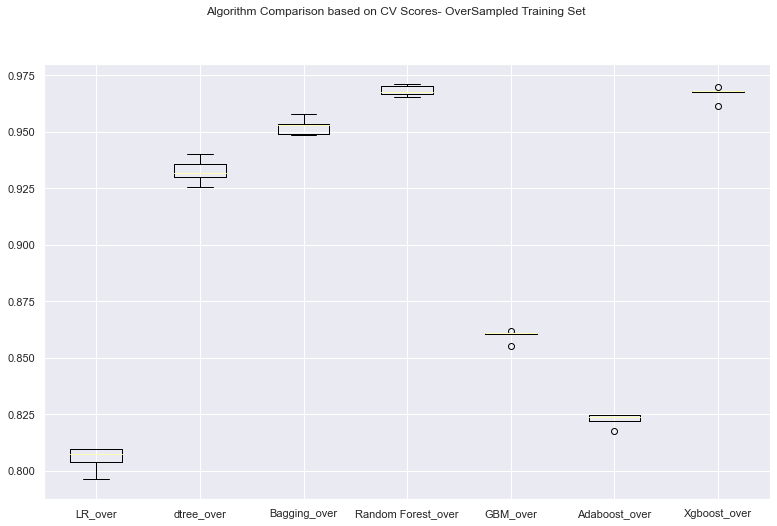

In [50]:
# Boxplots for CV scores of all models on OverSampled Training Set
fig = plt.figure(figsize=(13, 8))

fig.suptitle("Algorithm Comparison based on CV Scores- OverSampled Training Set")
ax = fig.add_subplot(111)

plt.boxplot(results_over)
ax.set_xticklabels(names_over)

plt.show()

#### Model Performance on Training Data

In [34]:
# creating empty data frame With NaN values
df_metrics_train_over = pd.DataFrame(columns = ['Accuracy', 'Recall', 'Precision', 'F1', 'Minimum_Vs_Model_cost'])
    
# adding rows to the empty data frame
for name, model in models_over:
    df_metrics_train_over.loc[name] = model_performance_classification_sklearn(model.fit(X_train_over, y_train_over), X_train_over, y_train_over).loc[0]

df_metrics_train_over

,Accuracy,Recall,Precision,F1,Minimum_Vs_Model_cost
LR_over,0.879989,0.878879,0.880835,0.879856,0.805476
dtree_over,1.000000,1.000000,1.000000,1.000000,1.000000
Bagging_over,0.998819,0.997990,0.999647,0.998818,0.996545
Random Forest_over,1.000000,1.000000,1.000000,1.000000,1.000000
GBM_over,0.938840,0.911283,0.964436,0.937107,0.862767
Adaboost_over,0.901657,0.891678,0.909837,0.900666,0.826453
Xgboost_over,0.997585,0.996157,0.999010,0.997581,0.993310


#### Model Performance on Validation Data

In [35]:
# creating empty data frame With NaN values
df_metrics_val_over = pd.DataFrame(columns = ['Accuracy', 'Recall', 'Precision', 'F1', 'Minimum_Vs_Model_cost'])
    
# adding rows to the empty data frame
for name, model in models_over:
    df_metrics_val_over.loc[name] = model_performance_classification_sklearn(model.fit(X_train_over, y_train_over), X_val, y_val).loc[0]

df_metrics_val_over

,Accuracy,Recall,Precision,F1,Minimum_Vs_Model_cost
LR_over,0.8823,0.846435,0.297558,0.440323,0.520292
dtree_over,0.9493,0.802559,0.523866,0.633935,0.636047
Bagging_over,0.9802,0.819013,0.819013,0.819013,0.734228
Random Forest_over,0.9893,0.851920,0.947154,0.897016,0.791988
GBM_over,0.9577,0.886654,0.573286,0.696339,0.709775
Adaboost_over,0.9012,0.839122,0.337748,0.481637,0.550486
Xgboost_over,0.9854,0.872029,0.862568,0.867273,0.793904


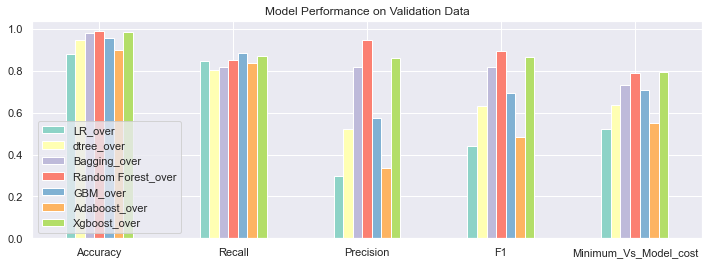

In [52]:
#setting color
color=sns. set_palette("Set3");

#plotting
df_metrics_val_over.T.plot(kind="bar", figsize=(12, 4));
plt.legend(df_metrics_val_over.T.columns.tolist(), loc='lower left');
plt.xticks(rotation=0);
plt.title('Model Performance on Validation Data');

# <a name='link7'>  7. Model Building with Undersampled data </a>

### 7.1- UnderSampled Data

In [36]:
# Random undersampler for under sampling the data
rus = RandomUnderSampler(random_state=1, sampling_strategy=1)
X_train_un, y_train_un = rus.fit_resample(X_train, y_train)

print("\nNumber (percentage) of {} in the undersampled training set:".format(target))
print("failure:      {0} ({1:2.2f}%)".format(y_train_un[target].value_counts()[1], y_train_un[target].value_counts(normalize=True)[1] * 100 ))
print("no failure:   {0} ({1:2.2f}%)".format(y_train_un[target].value_counts()[0], y_train_un[target].value_counts(normalize=True)[0] * 100 ))


Number (percentage) of Target in the undersampled training set:
failure:      1640 (50.00%)
no failure:   1640 (50.00%)


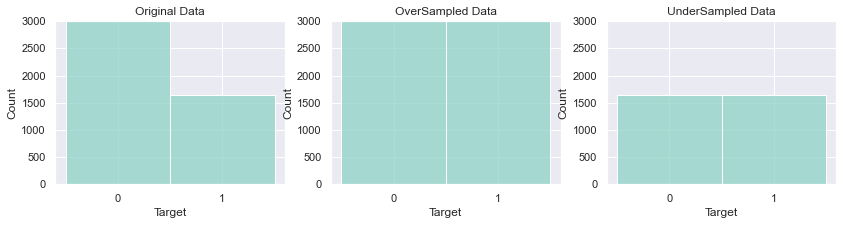

In [54]:
#plotting 
plt.figure(figsize=(14, 3))

plt.subplot(1, 3, 1)
ax=sns.histplot(y_train['Target'].apply(str));
plt.ylim([0, 3000]);
plt.title('Original Data');

plt.subplot(1, 3, 2)
ax=sns.histplot(y_train_over['Target'].apply(str));
plt.ylim([0, 3000]);
plt.title('OverSampled Data');

plt.subplot(1, 3, 3)
ax=sns.histplot(y_train_un['Target'].apply(str));
plt.ylim([0, 3000]);
plt.title('UnderSampled Data');

### 7.2- Classifying Models

In [37]:
models_un = []  # Empty list to store all the models

# Appending models into the list
models_un.append(("LR_un", LogisticRegression(random_state=1)))
models_un.append(("dtree_un", DecisionTreeClassifier(random_state=1)))
models_un.append(("Bagging_un", BaggingClassifier(random_state=1)))
models_un.append(("Random Forest_un", RandomForestClassifier(random_state=1)))
models_un.append(("GBM_un", GradientBoostingClassifier(random_state=1)))
models_un.append(("Adaboost_un", AdaBoostClassifier(random_state=1)))
models_un.append(("Xgboost_un", XGBClassifier(random_state=1, eval_metric="logloss")))

results_un = []  # Empty list to store all model's CV scores
names_un = []  # Empty list to store name of the models

### 7.3 Model Performance Evaluation

#### Cross Validation on UnderSampled Training Data

In [56]:
# loop through all models to get the mean cross validated score
for name, model in models_un:
    scoring = scoring
    kfold = StratifiedKFold(
        n_splits=5, shuffle=True, random_state=1
    )  # Setting number of splits equal to 5
    cv_result = cross_val_score(
        estimator=model, X=X_train_un, y=y_train_un, scoring=scoring, cv=kfold
    )
    results_un.append(cv_result)
    names_un.append(name)

In [57]:
print('\nSummary Statistics of CV Scores on UnderSampled Training Set:')
df_CV_score_un = pd.DataFrame()
df_CV_score_un[" "] = names_un
df_CV_score_un["Min"] = np.array(results_un).min(axis=1)
df_CV_score_un["Average"] = np.array(results_un).mean(axis=1)
df_CV_score_un["Max"] = np.array(results_un).max(axis=1)
df_CV_score_un["STD"] = np.array(results_un).std(axis=1)
df_CV_score_un.set_index(' ',inplace=True)
df_CV_score_un.T


Summary Statistics of CV Scores on UnderSampled Training Set:


,LR_un,dtree_un,Bagging_un,Random Forest_un,GBM_un,Adaboost_un,Xgboost_un
Min,0.751145,0.742642,0.776025,0.811212,0.804579,0.761610,0.815244
Average,0.780286,0.768097,0.798762,0.835430,0.828668,0.782108,0.836211
Max,0.822055,0.796117,0.825503,0.863916,0.865435,0.802610,0.872340
STD,0.023516,0.018131,0.019018,0.018313,0.021045,0.014964,0.020041


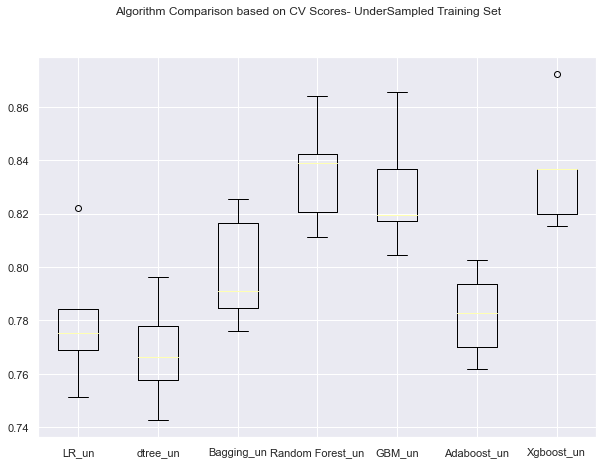

In [58]:
# Boxplots for CV scores of all models on UnderSampled Training Set
fig = plt.figure(figsize=(10, 7))

fig.suptitle("Algorithm Comparison based on CV Scores- UnderSampled Training Set")
ax = fig.add_subplot(111)

plt.boxplot(results_un)
ax.set_xticklabels(names_un)

plt.show()

#### Model Performance on Training Data

In [38]:
# creating empty data frame With NaN values
df_metrics_train_un = pd.DataFrame(columns = ['Accuracy', 'Recall', 'Precision', 'F1', 'Minimum_Vs_Model_cost'])
    
# adding rows to the empty data frame
for name, model in models_un:
    df_metrics_train_un.loc[name] = model_performance_classification_sklearn(model.fit(X_train_un, y_train_un), X_train_un, y_train_un).loc[0]

df_metrics_train_un

,Accuracy,Recall,Precision,F1,Minimum_Vs_Model_cost
LR_un,0.864024,0.855488,0.870347,0.862854,0.779221
dtree_un,1.000000,1.000000,1.000000,1.000000,1.000000
Bagging_un,0.990244,0.981707,0.998759,0.990160,0.970032
Random Forest_un,1.000000,1.000000,1.000000,1.000000,1.000000
GBM_un,0.946646,0.912195,0.979699,0.944743,0.867572
Adaboost_un,0.897561,0.884146,0.908521,0.896168,0.817819
Xgboost_un,1.000000,1.000000,1.000000,1.000000,1.000000


#### Model Performance on Validation Data

In [39]:
# creating empty data frame With NaN values
df_metrics_val_un = pd.DataFrame(columns = ['Accuracy', 'Recall', 'Precision', 'F1', 'Minimum_Vs_Model_cost'])
    
# adding rows to the empty data frame
for name, model in models_un:
    df_metrics_val_un.loc[name] = model_performance_classification_sklearn(model.fit(X_train_un, y_train_un), X_val, y_val).loc[0]

df_metrics_val_un

,Accuracy,Recall,Precision,F1,Minimum_Vs_Model_cost
LR_un,0.8700,0.851920,0.276558,0.417563,0.502603
dtree_un,0.8525,0.859232,0.251606,0.389234,0.479264
Bagging_un,0.9534,0.868373,0.546605,0.670904,0.685177
Random Forest_un,0.9625,0.886654,0.607769,0.721190,0.724823
GBM_un,0.9441,0.888483,0.493902,0.634879,0.671440
Adaboost_un,0.8784,0.862888,0.292622,0.437037,0.519797
Xgboost_un,0.9627,0.893967,0.608209,0.723908,0.730632


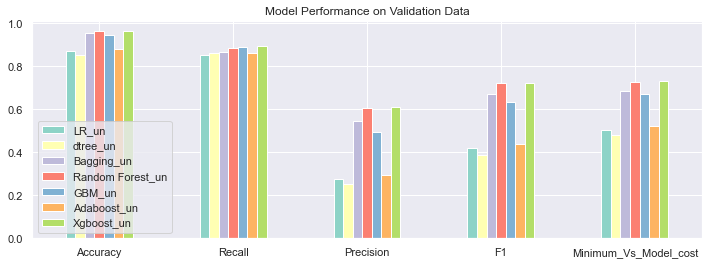

In [60]:
#setting color
color=sns. set_palette("Set3");

#plotting
df_metrics_val_un.T.plot(kind="bar", figsize=(12, 4));
plt.legend(df_metrics_val_un.T.columns.tolist(), loc='lower left');
plt.xticks(rotation=0);
plt.title('Model Performance on Validation Data');

# <a name='link8'>  8. Model Selection for Tuning </a>

Let us look at the summary of evaluation scores on the models to compare model performances and choose the three best ones.

### 8.1 Cross Validation Score of all Models

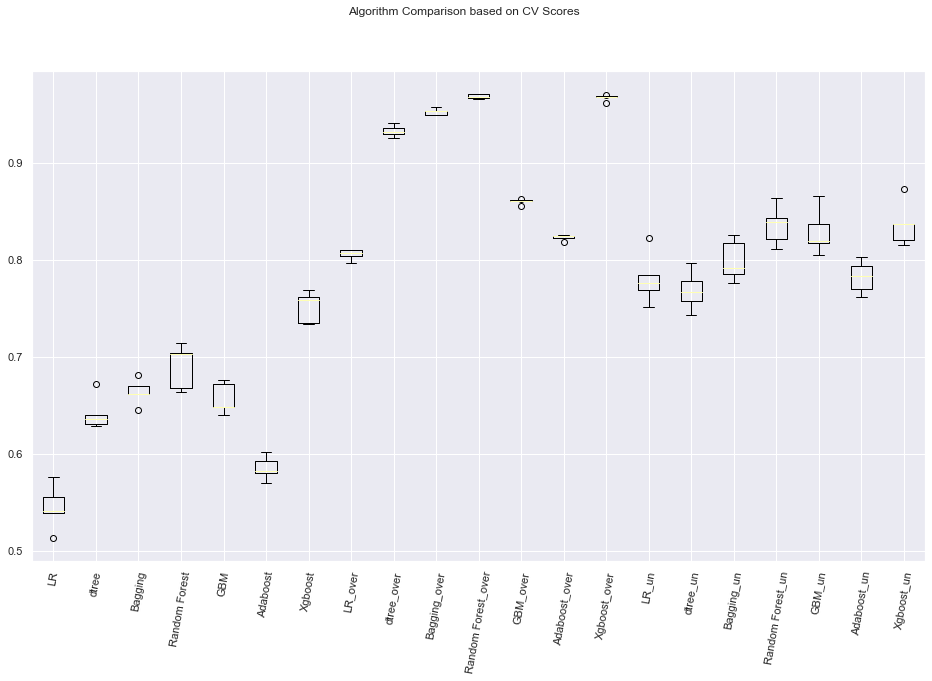

In [79]:
names_all= names+ names_over+ names_un
results_all= results+ results_over+ results_un

# Boxplots for CV scores of all models
fig = plt.figure(figsize=(16, 9))

fig.suptitle("Model Comparison based on CV Scores")
ax = fig.add_subplot(111)

plt.boxplot(results_all)
ax.set_xticklabels(names_all)
plt.xticks(rotation=80);

plt.show()

* Among the models, **Random Forest_over**, **Xgboost_over**, **Bagging_over**, and **dtree_over** have the best performances because they have higher average CV scores (greater than 0.9) woth lower standard deviations.
* LR is the worst model due to its lowest average score (lower than 0.6).

### 8.2 Performance Summary of all Models on Training Set

In [40]:
models_comp_df_train = pd.concat(
    [ df_metrics_train.T, df_metrics_train_over.T,  df_metrics_train_un.T]
    , axis=1)

print("\nperformance summary of all models on training set:")
models_comp_df_train.T


performance summary of all models on training set:


,Accuracy,Recall,Precision,F1,Minimum_Vs_Model_cost
LR,0.969733,0.518902,0.877320,0.652107,0.547640
dtree,1.000000,1.000000,1.000000,1.000000,1.000000
Bagging,0.996733,0.941463,0.998706,0.969240,0.910774
Random Forest,0.999967,0.999390,1.000000,0.999695,0.998985
GBM,0.985600,0.762805,0.966770,0.852761,0.712218
Adaboost,0.975033,0.609146,0.902439,0.727339,0.597595
Xgboost,0.999933,0.998780,1.000000,0.999390,0.997972
LR_over,0.879989,0.878879,0.880835,0.879856,0.805476
dtree_over,1.000000,1.000000,1.000000,1.000000,1.000000
Bagging_over,0.998819,0.997990,0.999647,0.998818,0.996545


### 8.2 Performance Summary of all Models on Validation Set

In [41]:
models_comp_df_val = pd.concat(
    [ df_metrics_val.T, df_metrics_val_over.T,  df_metrics_val_un.T]
    , axis=1)

print("\nperformance summary of all models on validation set:")
models_comp_df_val.T


performance summary of all models on validation set:


,Accuracy,Recall,Precision,F1,Minimum_Vs_Model_cost
LR,0.9685,0.491773,0.879085,0.630715,0.534876
dtree,0.9671,0.703839,0.697464,0.700637,0.626814
Bagging,0.9825,0.707495,0.962687,0.815595,0.668160
Random Forest,0.9857,0.747715,0.987923,0.851197,0.702483
GBM,0.9814,0.702011,0.943489,0.805031,0.661960
Adaboost,0.9710,0.575868,0.844504,0.684783,0.573977
Xgboost,0.9888,0.809872,0.982262,0.887776,0.756570
LR_over,0.8823,0.846435,0.297558,0.440323,0.520292
dtree_over,0.9493,0.802559,0.523866,0.633935,0.636047
Bagging_over,0.9802,0.819013,0.819013,0.819013,0.734228


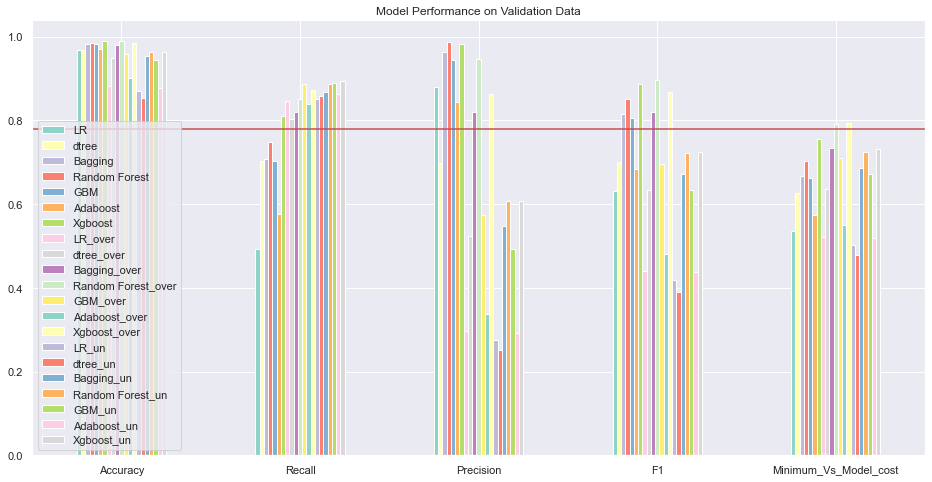

In [42]:
#setting color
color=sns.set_palette("Set3");

#plotting
models_comp_df_val.plot(kind="bar", figsize=(16, 8));
plt.legend(models_comp_df_val.columns.tolist(), loc='lower left');
plt.xticks(rotation=0);
# adding a horizontal line
plt.axhline(y=0.78, color='r', linestyle='-', label="score threshold")

plt.title('Model Performance on Validation Data');

* Among the models, **Random Forest_over**, **Xgboost_over** have the best performances with **Minimum_Vs_Model_cost** value of 0.791988 and 0.793904 on validation set, respectively. We can see that values of other metrics such as Accuracy, Recall, Precision, and F1 are also very high (greater than 0.85) for these models.  

In [43]:
models_comp_df_val.T[models_comp_df_val.T['Minimum_Vs_Model_cost']> 0.78]

,Accuracy,Recall,Precision,F1,Minimum_Vs_Model_cost
Random Forest_over,0.9893,0.851920,0.947154,0.897016,0.791988
Xgboost_over,0.9854,0.872029,0.862568,0.867273,0.793904


### 8.3 Three Chosen Models
We Choose **<font color='purple'>Random Forest_over</font>**, **<font color='purple'>Xgboost_over</font>**, and **<font color='purple'>dtree_over</font>** as three best performing models among all the models built previously to further tune them to improve the performance. The reason for the choices is that:

* Random Forest_over, Xgboost_over have the ''highest average'' and ''lowest standard deviation'' of ''CV scores''.
* Random Forest_over, Xgboost_over have the ''highest Minimum_Vs_Model_cost'' value on validation set.
* dtree_over has a very high average CV scores (greater than 0.9) and a very low standard deviation. 
* Although, dtree_over's ''Minimum_Vs_Model_cost'' of 0.636047 on validation set is not very promising, we think that tuning this model might be beneficial as it is a simple model compared to other models and would rather take a less time for GridSearchCV. 

# <a name='link9'>  9. HyperparameterTuning  </a> 

We aim to tune **<font color='purple'>Random Forest_over</font>**, **<font color='purple'>Xgboost_over</font>**, and **<font color='purple'>dtree_over</font>** classifying models.

In [44]:
# Random Forest_over, Xgboost_over, and dtree_over classifiers
Random_Forest_over= RandomForestClassifier(random_state=1);
Xgboost_over= XGBClassifier(random_state=1, eval_metric="logloss");
dtree_over= DecisionTreeClassifier(random_state=1);

# fitting models on oversampled training set
Random_Forest_over.fit(X_train_over, y_train_over);
Xgboost_over.fit(X_train_over, y_train_over);
dtree_over.fit(X_train_over, y_train_over);

### 9.1 Important Features

- **Hyperparameter tuning can take a long time to run. To avoid that time complexity we first study feature importance of the models in order to drop features that are not crucial for the predictions**.

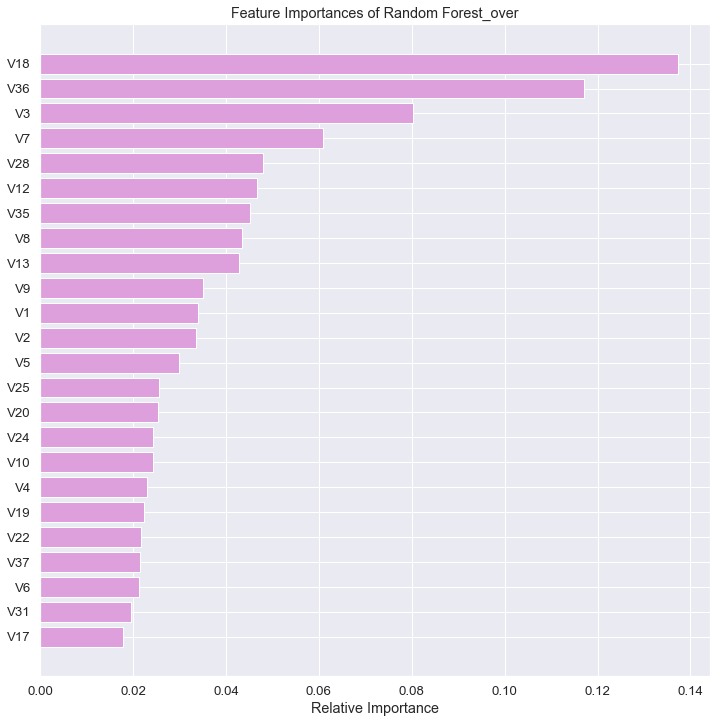

In [49]:
# creating a list of column names
feature_names = X_train_over.columns.to_list()

CL=Random_Forest_over
CL_name= 'Random Forest_over'

# Displaying important features
importances = CL.feature_importances_
indices = np.argsort(importances)

#plotting
sns.set(font_scale = 1.2)
plt.figure(figsize=(12, 12))
plt.title("Feature Importances of {}".format(CL_name))
plt.barh(range(len(indices)), importances[indices], color="plum", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

#important features
selected_features_rf= set(X_train_over.columns[indices.tolist()])

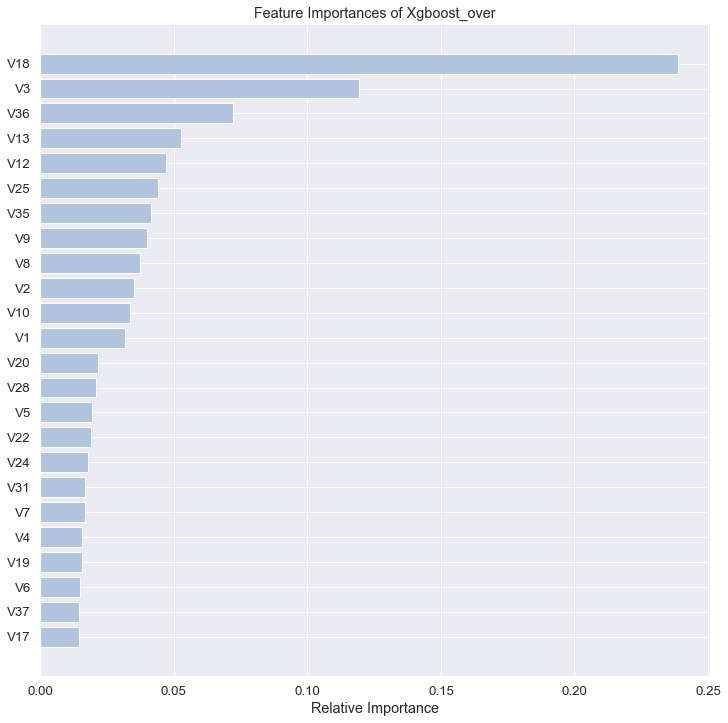

In [50]:
# creating a list of column names
feature_names = X_train_over.columns.to_list()

CL=Xgboost_over
CL_name= 'Xgboost_over'

# Displaying important features
importances = CL.feature_importances_
indices = np.argsort(importances)

sns.set(font_scale = 1.2)
plt.figure(figsize=(12, 12))
plt.title("Feature Importances of {}".format(CL_name))
plt.barh(range(len(indices)), importances[indices], color="lightsteelblue", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

#important features
selected_features_Xgb= set(X_train_over.columns[indices.tolist()])

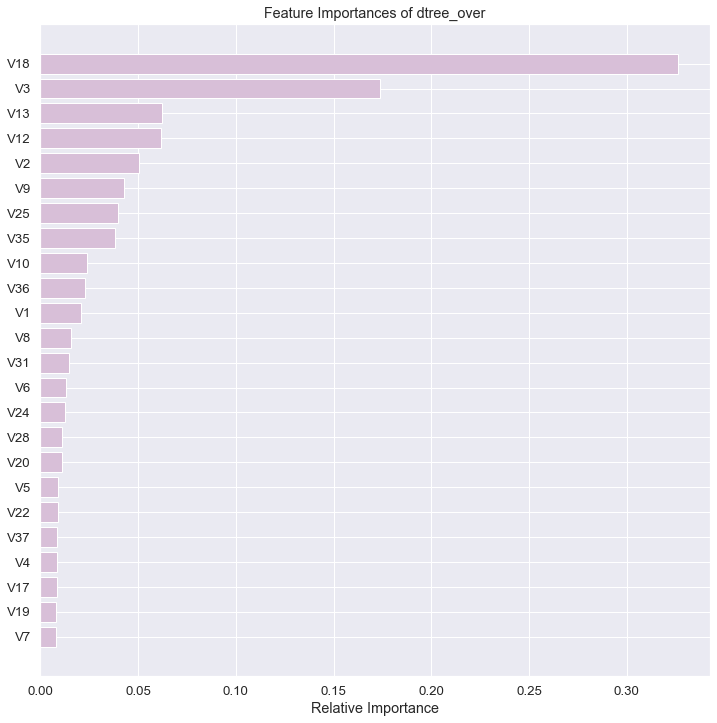

In [51]:
# creating a list of column names
feature_names = X_train_over.columns.to_list()

CL=dtree_over
CL_name= 'dtree_over'

# Displaying important features
importances = CL.feature_importances_
indices = np.argsort(importances)

sns.set(font_scale = 1.2)
plt.figure(figsize=(12, 12))
plt.title("Feature Importances of {}".format(CL_name))
plt.barh(range(len(indices)), importances[indices], color="thistle", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

#important features
selected_features_dtree= set(X_train_over.columns[indices.tolist()])

In [52]:
# unifying important features of all models
selected_features_all= list(set.union(selected_features_rf, selected_features_Xgb, selected_features_dtree))

# removing unimportant features from data sets
X_train_final= X_train_over[selected_features_all]
X_val_final= X_val[selected_features_all]
X_test_final= X_test[selected_features_all]

y_train_final= y_train_over
y_val_final= y_val
y_test_final= y_test

### 9.2 Tuning Random Forest on OverSamlpled Data
### $\;\;\;\;$ `RandomizedSearchCV`

In [193]:
%%time 

# defining model
model = Random_Forest_over

# Parameter grid to pass in GridSearchCV

param_grid = { 
    "n_estimators": [150,250], 
    "min_samples_leaf": np.arange(1, 3), 
    "max_features": ['sqrt','log2'], 
    "max_samples": np.arange(0.2, 0.6, 0.1)
}


# Type of scoring used to compare parameter combinations
scoring = scoring

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=model, param_distributions=param_grid, n_jobs = -1, n_iter=20, scoring=scoring, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_final,y_train_final)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'n_estimators': 250, 'min_samples_leaf': 1, 'max_samples': 0.5000000000000001, 'max_features': 'sqrt'} with CV score=0.9588031558767479:
Wall time: 17min 54s


In [53]:
# Set the model to the best combination of parameters
#Random_Forest_over_tuned = randomized_cv.best_estimator_
Random_Forest_over_tuned = RandomForestClassifier(
    random_state=1,
    n_estimators=250,
    min_samples_leaf= 1,
    max_samples= 0.5000000000000001,
    max_features= 'sqrt'
)

# Fit the model on training data
Random_Forest_over_tuned.fit(X_train_final, y_train_final);

In [73]:
model= Random_Forest_over_tuned

# creating empty data frame With NaN values
df_metrics_tuned_rf = pd.DataFrame(columns = ['Accuracy', 'Recall', 'Precision', 'F1', 'Minimum_Vs_Model_cost'])
    
# adding rows to the empty data frame
df_metrics_tuned_rf.loc['train'] = model_performance_classification_sklearn(model.fit(X_train_final, y_train_final), X_train_final, y_train_final).loc[0]
df_metrics_tuned_rf.loc['val'] = model_performance_classification_sklearn(model.fit(X_train_final, y_train_final), X_val_final, y_val_final).loc[0]
print("\nperformance of tuned random forest on training and validation set:")
df_metrics_tuned_rf


performance of tuned random forest on training and validation set:


,Accuracy,Recall,Precision,F1,Minimum_Vs_Model_cost
train,0.998695,0.997779,0.999611,0.998694,0.996183
val,0.988900,0.862888,0.929134,0.894787,0.799708


### 9.3 Tuning Xgboost on OverSamlpled Data
### $\;\;\;\;$ `RandomizedSearchCV`

In [226]:
%%time 

# defining model
model = Xgboost_over

# Parameter grid to pass in GridSearchCV

param_grid={'n_estimators':np.arange(150,300,50),
            'scale_pos_weight':[5,10], 
            'learning_rate':[0.1,0.2], 
            'gamma':[0,3,5], 
            'subsample':[0.8,0.9]}


# Type of scoring used to compare parameter combinations
scoring = scoring

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=model, param_distributions=param_grid, n_jobs = -1, n_iter=20, scoring=scoring, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_final, y_train_final)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'subsample': 0.9, 'scale_pos_weight': 10, 'n_estimators': 200, 'learning_rate': 0.2, 'gamma': 0} with CV score=0.9856653465063806:
Wall time: 1h 24min 7s


In [59]:
# Set the model to the best combination of parameters
#Xgboost_over_tuned = randomized_cv.best_estimator_
Xgboost_over_tuned = XGBClassifier(
    random_state=1,
    n_estimators=200,
    scale_pos_weight=10,
    gamma=0,
    subsample=0.9,
    learning_rate=0.2,
    eval_metric="logloss"
)

# Fit the model on training data
Xgboost_over_tuned.fit(X_train_final, y_train_final);

In [72]:
model= Xgboost_over_tuned

# creating empty data frame With NaN values
df_metrics_tuned_xgb = pd.DataFrame(columns = ['Accuracy', 'Recall', 'Precision', 'F1', 'Minimum_Vs_Model_cost'])
    
# adding rows to the empty data frame
df_metrics_tuned_xgb.loc['train'] = model_performance_classification_sklearn(model.fit(X_train_final, y_train_final), X_train_final, y_train_final).loc[0]
df_metrics_tuned_xgb.loc['val'] = model_performance_classification_sklearn(model.fit(X_train_final, y_train_final), X_val_final, y_val_final).loc[0]
print("\nperformance of tuned Xgboost on training and validation set:")
df_metrics_tuned_xgb


performance of tuned Xgboost on training and validation set:


,Accuracy,Recall,Precision,F1,Minimum_Vs_Model_cost
train,0.998519,1.000000,0.997047,0.998521,0.999014
val,0.981300,0.886654,0.795082,0.838375,0.790462


### 9.4 Tuning Decision Tree on OverSamlpled Data
### $\;\;\;\;$ `GridSearchCV`

In [235]:
%%time 

# defining model
model = dtree_over

# Parameter grid to pass in GridSearchCV
param_grid = {'max_depth': [2, 5, 10, 15, 20, 30], 
              'min_samples_leaf': [1, 2, 5, 7], 
              'max_leaf_nodes' : [2, 5, 10,15, 20], 
              'min_impurity_decrease': [0.1, 0.0001,0.001] }

# Type of scoring used to compare parameter combinations
scoring = scoring

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=model, param_distributions=param_grid, n_jobs = -1, n_iter=40, scoring=scoring, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_final, y_train_final)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'min_samples_leaf': 7, 'min_impurity_decrease': 0.0001, 'max_leaf_nodes': 20, 'max_depth': 10} with CV score=0.7875121386631037:
Wall time: 57.5 s


In [57]:
# Set the model to the best combination of parameters
#dtree_over_tuned = randomized_cv.best_estimator_
dtree_over_tuned = DecisionTreeClassifier(
    min_samples_leaf=7, 
    min_impurity_decrease=0.0001, 
    max_leaf_nodes=20,
    max_depth=10
)

# Fit the model on training data
dtree_over_tuned.fit(X_train_final, y_train_final);

In [74]:
model= dtree_over_tuned

# creating empty data frame With NaN values
df_metrics_tuned_dtree = pd.DataFrame(columns = ['Accuracy', 'Recall', 'Precision', 'F1', 'Minimum_Vs_Model_cost'])
    
# adding rows to the empty data frame
df_metrics_tuned_dtree.loc['train'] = model_performance_classification_sklearn(model.fit(X_train_final, y_train_final), X_train_final, y_train_final).loc[0]
df_metrics_tuned_dtree.loc['val'] = model_performance_classification_sklearn(model.fit(X_train_final, y_train_final), X_val_final, y_val_final).loc[0]
print("\nperformance of tuned decision tree on training and validation set:")
df_metrics_tuned_dtree


performance of tuned decision tree on training and validation set:


,Accuracy,Recall,Precision,F1,Minimum_Vs_Model_cost
train,0.881506,0.867031,0.892879,0.879765,0.795996
val,0.888100,0.811700,0.304110,0.442451,0.517339


### 9.5 Comparison of Tuned Models

##### Model Performance on Training Data

In [79]:
# creating empty data frame With NaN values
df_all_train_tuned = pd.DataFrame(columns = ['Accuracy', 'Recall', 'Precision', 'F1', 'Minimum_Vs_Model_cost'])
    
# adding rows to the empty data frame
df_all_train_tuned.loc['Random_Forest_over_tuned'] = df_metrics_tuned_rf.loc['train']
df_all_train_tuned.loc['Xgboost_over_tuned'] = df_metrics_tuned_xgb.loc['train']
df_all_train_tuned.loc['dtree_over_tuned'] = df_metrics_tuned_dtree.loc['train']
print("\nperformance of tuned models on training set:")
df_all_train_tuned


performance of tuned models on training set:


,Accuracy,Recall,Precision,F1,Minimum_Vs_Model_cost
Random_Forest_over_tuned,0.998695,0.997779,0.999611,0.998694,0.996183
Xgboost_over_tuned,0.998519,1.000000,0.997047,0.998521,0.999014
dtree_over_tuned,0.881506,0.867031,0.892879,0.879765,0.795996


##### Model Performance on Validation Data

In [78]:
# creating empty data frame With NaN values
df_all_val_tuned = pd.DataFrame(columns = ['Accuracy', 'Recall', 'Precision', 'F1', 'Minimum_Vs_Model_cost'])
    
# adding rows to the empty data frame
df_all_val_tuned.loc['Random_Forest_over_tuned'] = df_metrics_tuned_rf.loc['val']
df_all_val_tuned.loc['Xgboost_over_tuned'] = df_metrics_tuned_xgb.loc['val']
df_all_val_tuned.loc['dtree_over_tuned'] = df_metrics_tuned_dtree.loc['val']
print("\nperformance of tuned models on validation set:")
df_all_val_tuned


performance of tuned models on validation set:


,Accuracy,Recall,Precision,F1,Minimum_Vs_Model_cost
Random_Forest_over_tuned,0.9889,0.862888,0.929134,0.894787,0.799708
Xgboost_over_tuned,0.9813,0.886654,0.795082,0.838375,0.790462
dtree_over_tuned,0.8881,0.811700,0.304110,0.442451,0.517339


# <a name='link10'>  10. Comparing all Models  </a> 

### 10.1 Summary of Performances on Training Data

In [99]:
# training performance comparison
df_all_train = pd.concat( [ models_comp_df_train.T, df_all_train_tuned], axis=0)
print("\nperformance of all models on training set:")
df_all_train


performance of all models on training set:


,Accuracy,Recall,Precision,F1,Minimum_Vs_Model_cost
LR,0.969733,0.518902,0.877320,0.652107,0.547640
dtree,1.000000,1.000000,1.000000,1.000000,1.000000
Bagging,0.996733,0.941463,0.998706,0.969240,0.910774
Random Forest,0.999967,0.999390,1.000000,0.999695,0.998985
GBM,0.985600,0.762805,0.966770,0.852761,0.712218
Adaboost,0.975033,0.609146,0.902439,0.727339,0.597595
Xgboost,0.999933,0.998780,1.000000,0.999390,0.997972
LR_over,0.879989,0.878879,0.880835,0.879856,0.805476
dtree_over,1.000000,1.000000,1.000000,1.000000,1.000000
Bagging_over,0.998819,0.997990,0.999647,0.998818,0.996545


### 10.2 Summary of Performances on Validation Data

In [100]:
# validation performance comparison
df_all_val = pd.concat( [ models_comp_df_val.T, df_all_val_tuned], axis=0)
print("\nperformance of all models on validation set:")
df_all_val


performance of all models on validation set:


,Accuracy,Recall,Precision,F1,Minimum_Vs_Model_cost
LR,0.9685,0.491773,0.879085,0.630715,0.534876
dtree,0.9671,0.703839,0.697464,0.700637,0.626814
Bagging,0.9825,0.707495,0.962687,0.815595,0.668160
Random Forest,0.9857,0.747715,0.987923,0.851197,0.702483
GBM,0.9814,0.702011,0.943489,0.805031,0.661960
Adaboost,0.9710,0.575868,0.844504,0.684783,0.573977
Xgboost,0.9888,0.809872,0.982262,0.887776,0.756570
LR_over,0.8823,0.846435,0.297558,0.440323,0.520292
dtree_over,0.9493,0.802559,0.523866,0.633935,0.636047
Bagging_over,0.9802,0.819013,0.819013,0.819013,0.734228


### 10.3 Models with Highest "Minimum_Vs_Model_cost" 

Among all models, `Minimum_Vs_Model_cost` of the following models is greater than 0.78 on the validation set. 

In [101]:
best_model_list= df_all_val[df_all_val['Minimum_Vs_Model_cost']>0.78].T.columns
print("\nperformance of models with 'Minimum_Vs_Model_cost' greater than 0.78 on validation set:")
df_all_val[df_all_val['Minimum_Vs_Model_cost']>0.78]


performance of models with 'Minimum_Vs_Model_cost' greater than 0.78 on validation set:


,Accuracy,Recall,Precision,F1,Minimum_Vs_Model_cost
Random Forest_over,0.9893,0.851920,0.947154,0.897016,0.791988
Xgboost_over,0.9854,0.872029,0.862568,0.867273,0.793904
Random_Forest_over_tuned,0.9889,0.862888,0.929134,0.894787,0.799708
Xgboost_over_tuned,0.9813,0.886654,0.795082,0.838375,0.790462


Let us take a look at the training performance of these models.

In [103]:
print("\nperformance of the selected models on training set:")
df_all_train.T[best_model_list].T


performance of the selected models on training set:


,Accuracy,Recall,Precision,F1,Minimum_Vs_Model_cost
Random Forest_over,1.000000,1.000000,1.000000,1.000000,1.000000
Xgboost_over,0.997585,0.996157,0.999010,0.997581,0.993310
Random_Forest_over_tuned,0.998695,0.997779,0.999611,0.998694,0.996183
Xgboost_over_tuned,0.998519,1.000000,0.997047,0.998521,0.999014


# <a name='link11'>  11. The Final Model  </a> 

### 11.1 Selecting the Final Model

The best model is **<font style="font-family: Arial; font-size:1.1em;color:purple;"> the tuned random forest classifier </font>** with the following parameters (random_state=1, n_estimators=250, min_samples_leaf= 1,max_samples= 0.5, max_features= 'sqrt') trained over our oversampled data.

### 11.2 Performance of the Final Model on Test Data

In [105]:
model= Random_Forest_over_tuned

print("\nperformance of the final model on test set:")
model_performance_classification_sklearn(model.fit(X_train_final, y_train_final), X_test_final, y_test_final)


performance of the final model on test set:


,Accuracy,Recall,Precision,F1,Minimum_Vs_Model_cost
0,0.9875,0.855576,0.910506,0.882187,0.788184


Confusion matrix of test set:


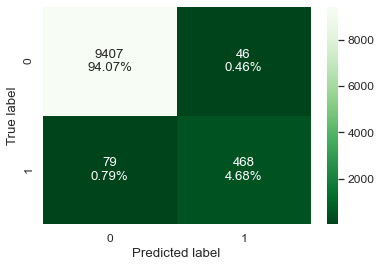

In [191]:
print("Confusion matrix of test set:")
confusion_matrix_sklearn(model.fit(X_train_final, y_train_final), X_test_final, y_test_final)

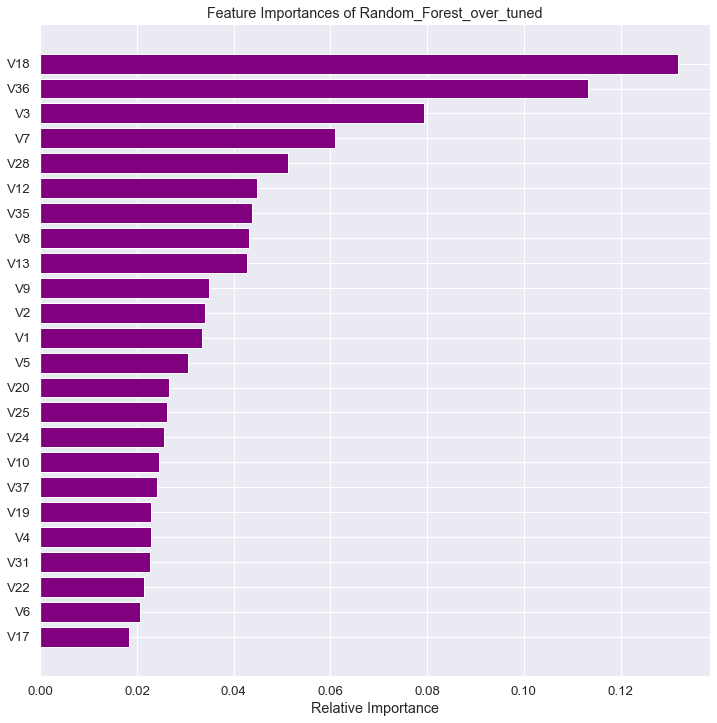

In [177]:
# creating a list of column names
feature_names = X_train_final.columns.to_list()

CL=Random_Forest_over_tuned
CL_name= 'Random_Forest_over_tuned'

# Displaying important features
importances = CL.feature_importances_
indices = np.argsort(importances)

#plotting
sns.set(font_scale = 1.2)
plt.figure(figsize=(12, 12))
plt.title("Feature Importances of {}".format(CL_name))
plt.barh(range(len(indices)), importances[indices], color="purple", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

#important features
selected_features_rf= set(X_train_over.columns[indices.tolist()])

* V18 and next V36 and V3 are the most influential factor.
* Overall, 24 features are important in model explanations.

# <a name='link12'>  12 Pipelines for Productionizing the Final Model  </a> 

Now, we have a final model. let's use pipelines to put the model into production. We will create a pipelines to:
* Do missing value imputation 
* Apply the final Classifier

##### Pipeline

In [180]:
# Creating new pipeline with best parameters
model_pipeline = Pipeline(
    steps=[
        ("imputer", KNNImputer(n_neighbors=5) ),
        ("Random_Forest_over_tuned", RandomForestClassifier(
                random_state=1,
                n_estimators=250,
                min_samples_leaf= 1,
                max_samples= 0.5000000000000001,
                max_features= 'sqrt',
            ),
        ),
    ]
)
# Fit the model on training data
model_pipeline.fit(X_train_over, y_train_over)

Pipeline(steps=[('imputer', KNNImputer()),
                ('Random_Forest_over_tuned',
                 RandomForestClassifier(max_features='sqrt',
                                        max_samples=0.5000000000000001,
                                        n_estimators=250, random_state=1))])

##### Prediction

In [188]:
y_predict= model_pipeline.predict(X_test);

# predictions on the test set
df_pred_test = pd.DataFrame({"Actual": y_test['Target'], "Predicted": y_predict})
df_pred_test.head(10)

,Actual,Predicted
0,0,0
1,0,0
2,0,0
3,0,0
4,0,0
5,1,1
6,0,0
7,0,0
8,0,0
9,0,0


# <a name='link13'>  13 Business Insights and Conclusions  </a> 

* The proposed classifying model can be used to predict which generator has the higher chance of failure and hence put them into a list so that the generator could be checked and if needed repaired before failing/breaking. This way the overall maintenance cost of the generators can be brought down.

Insight from the classifying models can be useful in determining a proper maintenance policy for the generators:
* As we saw in our analysis and also in the ML models, the following features have a very low impact on a generator failure: [V11, V14, V15, V16, V21, V23, V26, V27, V29, V30, V32, V33, V34, V38, V39, V40].

* Company should target the following features since they are very helpful in classifying failures and reducing maintenantce costs: [V10, V24, V8, V13, V6, V17, V12, V2, V3, V9, V19, V1, V20, V35, V25, V5, V31, V4, V37, V22, V7, V28, V36, V18].

* Among all features, **V18** and next **V36** and **V3** are the most influential factors in recognizing the failures and extra attention should be put on their corresponding data.

* We observed in our analysis that overal the chance of generator failure is far more less than non-failure.
* When the feature value is extremely large or extremely small it indicates that more probably there are no generator failures.
* If V1, V2, V4, V24, or V27 is greater than 5 or smaller than -5 then most probably there will be no generator failure.
* If value of V3, V5, V13, V18, V22, V31, or V36 value is greater than 5 then most probably there will be no generator failure. However, if the feature value is smaller than -5, there is a possibility that the generator would fail.
* If value of V7, V8, V17, V20, V28, or V29 value is less than -5 then most probably there will be no generator failure. However, if the feature value is greater than -5, there is probable that the generator would fail.
* When V2 is between (-5,5) and V7 values are high, the possibility of failure increases.
* When V2 is between (-5,5) and V16 values are high, the possibility of failure increases.
* When V2 is between (-5,5) and V22 values are low, the possibility of failure increases.
* When V7 is greater than zero and V8 values are greater than -1, the possibility of failure increases
